In [237]:
import os
import argparse
import logging
import time
import numpy as np
import numpy.random as npr
import matplotlib
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import copy
import cv2
from skimage.feature import peak_local_max
from torchvision import transforms
from scipy.ndimage.interpolation import zoom
import itertools
import pickle
from torchdiffeq import odeint_adjoint as odeint
from scipy.integrate import solve_ivp
from scipy.signal import convolve2d, correlate2d, convolve 
from IPython import display 
device = torch.device('cuda')

In [224]:
def lin_diffeq(t, x, A):
    dudt = A[0]*x[0]+ A[1]*x[1]
    dvdt = A[2]*x[0]+ A[3]*x[1]

    if isinstance(dudt, torch.Tensor):
        A = [dudt.numpy(), dvdt.numpy()]
    else:
        A = [dudt, dvdt]
    return A

def LC_diffeq(t,x):
    mu = 0
    if len(x) == 2:
        u = x[0]
        v = x[1]
    else:
        u = x[:,0]
        v = x[:,1]

    dudt = mu*u - v + u*v**2
    dvdt = u + mu*v + v**3
    if isinstance(dudt, torch.Tensor):
        A = [dudt.numpy(), dvdt.numpy()]
    else:
        A = [dudt, dvdt]
    return np.array(A)


In [1]:
%run Supporting_Function_v1.01.py
%run ODE_Func.py
%run Ploting_Function_v1.01.py

In [248]:
def crit_point(h):
    f_1 = h[0,:,:]
    f_2 = h[1,:,:]

    norm = f_1**2 + f_2**2


    G_x = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]
    G_y = [[-1, -2, -1], [0, 0, 0], [1, 2, 1]]
    grad_f_1 = convolve2d(f_1, G_x, mode="same") + convolve2d(f_1, G_y, mode="same")
    grad_f_2 = convolve2d(f_2, G_x, mode="same") + convolve2d(f_2, G_y, mode="same")
    index = np.true_divide(f_1*grad_f_2 - f_2*grad_f_1, norm)
    return index

In [259]:
size = 1000
X = np.linspace(-1, 1, size)

coord = np.array(np.meshgrid(X, X)).reshape(2, size**2)
h = np.zeros([2, size**2])

for i in range(size**2):
    try:
        h[:,i] = lin_diffeq(0, coord[:,i], A[4])
    except TypeError:
        h[:,i] = eq(0, coord[:,i])
coord = coord.reshape(2, size, size)
h = h.reshape(2, size, size)

f_1 = h[0,:,:]
f_2 = h[1,:,:]

norm = f_1**2 + f_2**2

G_x = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]
G_y = [[-1, -2, -1], [0, 0, 0], [1, 2, 1]]
grad_f_1 = convolve2d(f_1, G_x, mode="same") + convolve2d(f_1, G_y, mode="same")
grad_f_2 = convolve2d(f_2, G_x, mode="same") + convolve2d(f_2, G_y, mode="same")
index = np.true_divide(f_1*grad_f_2 - f_2*grad_f_1, norm)

C:\Users\Firelovesnow\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


In [234]:
def sample_diffEq(eq, A):
    size = 1000
    X = np.linspace(-1, 1, size)

    coord = np.array(np.meshgrid(X, X)).reshape(2, size**2)
    h = np.zeros([2, size**2])

    for i in range(size**2):
        try:
            h[:,i] = eq(0, coord[:,i], A)
        except TypeError:
            h[:,i] = eq(0, coord[:,i])

    coord = coord.reshape(2, size, size)
    h = h.reshape(2, size, size)
    return coord, h

In [270]:
A = np.array([[1, 0, 0, 1], [-1, 1, 1, 1], [-1, 0, 0, 1], [1, 1, 1, 1], [1, -1, 1, -1]])

C:\Users\Firelovesnow\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


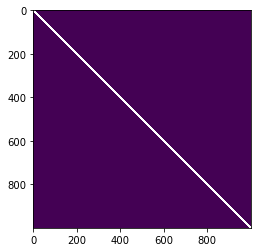

In [253]:
coord, h = sample_diffEq(lin_diffeq, A[4])
index = crit_point(h)
plt.figure()
plt.imshow(index)

nan

C:\Users\Firelovesnow\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':
C:\Users\Firelovesnow\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


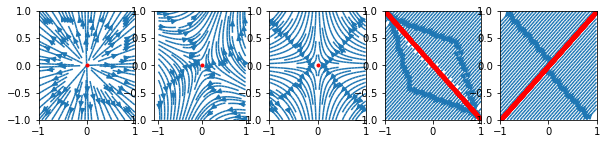

In [271]:
fig, axs = plt.subplots(1, 5)
fig.set_figheight(2)
fig.set_figwidth(10)
n = 10
size = 1000
X = np.linspace(-1, 1, size)

for i in range(5):
    coord, h = sample_diffEq(lin_diffeq, A[i])

    index = crit_point(h)
    coord_peak = peak_local_max(index, min_distance=1)
    coord_peak = peak_local_max(index, min_distance=1)
    coord_nan = np.argwhere(np.isnan(index))
    coord_peak = np.concatenate((coord_peak, coord_nan), axis = 0)

    x_peak = coord[0, coord_peak[:,0], coord_peak[:,1]]
    y_peak = coord[1, coord_peak[:,0], coord_peak[:,1]]

    axs[i].plot(x_peak, y_peak, 'r.')
    axs[i].streamplot(coord[0,:,:], coord[1,:,:], h[0,:,:], h[1,:,:])


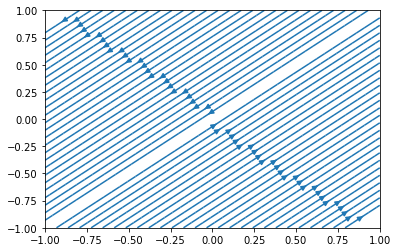

In [269]:
plt.figure()
plt.streamplot(coord[0,:,:], coord[1,:,:], h[0,:,:], h[1,:,:])

In [160]:
theta = np.arange(0,360)*np.pi/180
r = 15
bprint = np.zeros((2*r+1,2*r+1))
(m,n) = (r,r)                                                       #Finding out the center of the blueprint
for angle in theta:
    x = int(np.round(r*np.cos(angle)))
    y = int(np.round(r*np.sin(angle)))
    bprint[m+x,n+y] = 1